## 10x データ のVelocity解析

<br />
<img src="figures/230201_img04.png" alt="230201_img04" style="width: 1000px;"/>
<br />

## 動的モデルで登場する指標

### "gene-shared latent time" = 共有潜在時間 について

- 遺伝子の潜在時間は動的モデルによって推定される
- 細胞ごとに算出される "共有潜在時間" は、遺伝子ごとの潜在時間を結合し、多数決によって決定される

<img src="figures/230201_img07.png" alt="230201_img07" style="width: 800px;"/>

### "Putative Driver Gene" = ドライバー遺伝子について
- 尤度が高い遺伝子 = 相図でアーモンド状になっている度合いが高い遺伝子

<br />
<hr>

### 前準備

- ライブラリの読み込み

In [59]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as pl
import scanpy as sc
import igraph
import scvelo as scv
import loompy as lmp
import anndata
scv.logging.print_version()

Running scvelo 0.2.4 (python 3.10.8) on 2023-02-08 02:46.


ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI no longer supports 'pip search' (or XML-RPC search). Please use https://pypi.org/search (via a browser) instead. See https://warehouse.pypa.io/api-reference/xml-rpc.html#deprecated-methods for more information.


- 表示設定とカラー設定

In [60]:
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization
pl.rcParams["figure.figsize"] = (10,10)
Colorss=["#E41A1C","#377EB8","#4DAF4A","#984EA3","#FF7F00","#FFFF33","#A65628","#F781BF"]

### 入力データのインポート
- read_10x_mtx
  - Loupeブラウザで出力された発現マトリクスのディレクトリを指定する

In [61]:
# Define Path to the matrix output from cellranger
Path10x='/data/scVelo_10x_inputfiles/filtered_feature_bc_matrix/'

# Read matrix
Neutro3p = sc.read_10x_mtx(Path10x,var_names='gene_symbols',cache=True)

# Print information on this new object
Neutro3p

AnnData object with n_obs × n_vars = 8000 × 36601
    var: 'gene_ids', 'feature_types'

- 好中球のクラスター情報を読み込む

In [62]:
# Read clusters
Clusters_Loupe = pd.read_csv("/data/scVelo_10x_inputfiles//3p-Neutrophils-clusters.csv", delimiter=',',index_col=0)

# Create a list with only neutrophil Barcodes, becuase the dataset included other cell types.
Neutrophils_BCs=Clusters_Loupe.index

Clusters_Loupe.head()

,Neutrophils
Barcode,
AAACCCAGTTGTGCAT-1,Cluster 7
AAACGAACAATTGCGT-1,Cluster 1
AAACGCTTCGAGTCCG-1,Cluster 1
AAAGAACAGCGACTAG-1,Cluster 2
AAAGAACAGTCGAGGT-1,Cluster 4


- UMAP座標を読み込む

In [63]:
# Read UMAP embeddings
UMAP_Loupe = pd.read_csv("/data/scVelo_10x_inputfiles/3p-Neutrophils-UMAP-Projection.csv", delimiter=',',index_col=0)

# Select neutrophil barcodes in the projection
UMAP_Loupe=UMAP_Loupe.loc[Neutrophils_BCs,]

# Tansform to Numpy
UMAP_Loupe = UMAP_Loupe.to_numpy()

- 発現マトリクスを好中球サンプルのみにフィルタする
- クラスター情報を追加
- UMAP座標を追加

In [64]:
# Filter cells for only neutrophils
Neutro3p=Neutro3p[Neutrophils_BCs]

# Import cluster information into Neutro3p object
Neutro3p.obs['Loupe']=Clusters_Loupe

# Import UMAP information into Neutro3p object
Neutro3p.obsm["X_umap"]=UMAP_Loupe

# Print information about the object
Neutro3p

AnnData object with n_obs × n_vars = 3343 × 36601
    obs: 'Loupe'
    var: 'gene_ids', 'feature_types'
    obsm: 'X_umap'

- loomファイルを読み込み、クラスター + UMAPデータとマージする

In [65]:
# Read velocyto output
VelNeutro3p = scv.read('/data/velocyto_10x_Granulocytes/WB_Lysis_Granulocytes_3p_Introns_8kCells_possorted_genome_bam_XT9PJ.loom', cache=True)

# Merge velocyto with cellranger matrix
Neutro3p = scv.utils.merge(Neutro3p, VelNeutro3p)

- UMAPプロットの表示

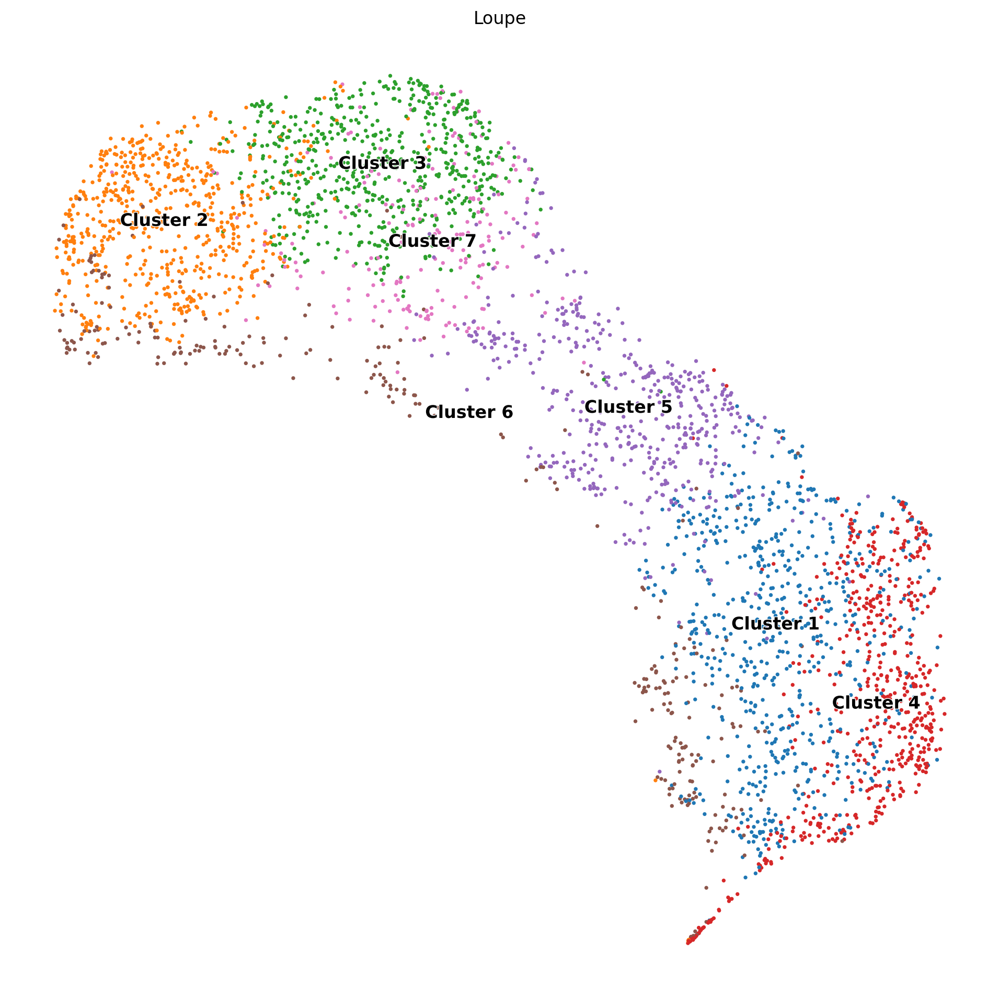

In [66]:
scv.pl.umap(Neutro3p, color="Loupe")

- クラスタごとのspliced/unsplicedの割合を表示

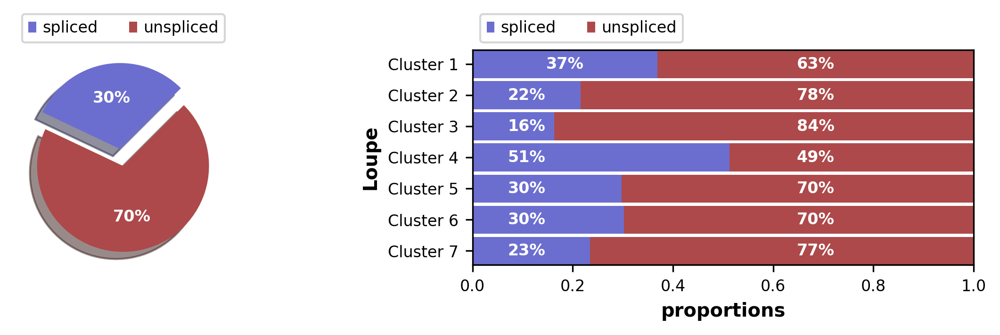

In [67]:
scv.pl.proportions(Neutro3p, groupby='Loupe',dpi=150)

### データ前処理

- scv.pp.filter_and_normalize
    - 細胞数またはカウント数に基づいて遺伝子をフィルタリング
    - Normalize each cell by total counts over all genes.
    - highly var genesの抽出
    - 自然対数でデータ行列を対数化する : 𝑋=log(𝑋+1)を計算
- scv.pp.moments
  - PCA空間上の近傍グラフから各細胞の1次/2次のモーメント(期待値と分散)を計算する

In [68]:
scv.pp.filter_and_normalize(Neutro3p, min_shared_counts=30, n_top_genes=2000)
scv.pp.moments(Neutro3p, n_pcs=30, n_neighbors=30)

Filtered out 35594 genes that are detected 30 counts (shared).
Normalized count data: X, spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [69]:
Neutro3p_dt = Neutro3p.copy()
Neutro3p_D = Neutro3p.copy()

<br />
<hr>

#### 決定論的モデルでのVelocity推定 + 低次元埋め込み

- velocity推定

In [70]:
scv.tl.velocity(Neutro3p_dt, mode='deterministic')

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


- 遷移確率行列の生成

In [71]:
scv.tl.velocity_graph(Neutro3p_dt)

computing velocity graph (using 1/20 cores)


  0%|          | 0/3343 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


- UMAPプロットへの埋め込み

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


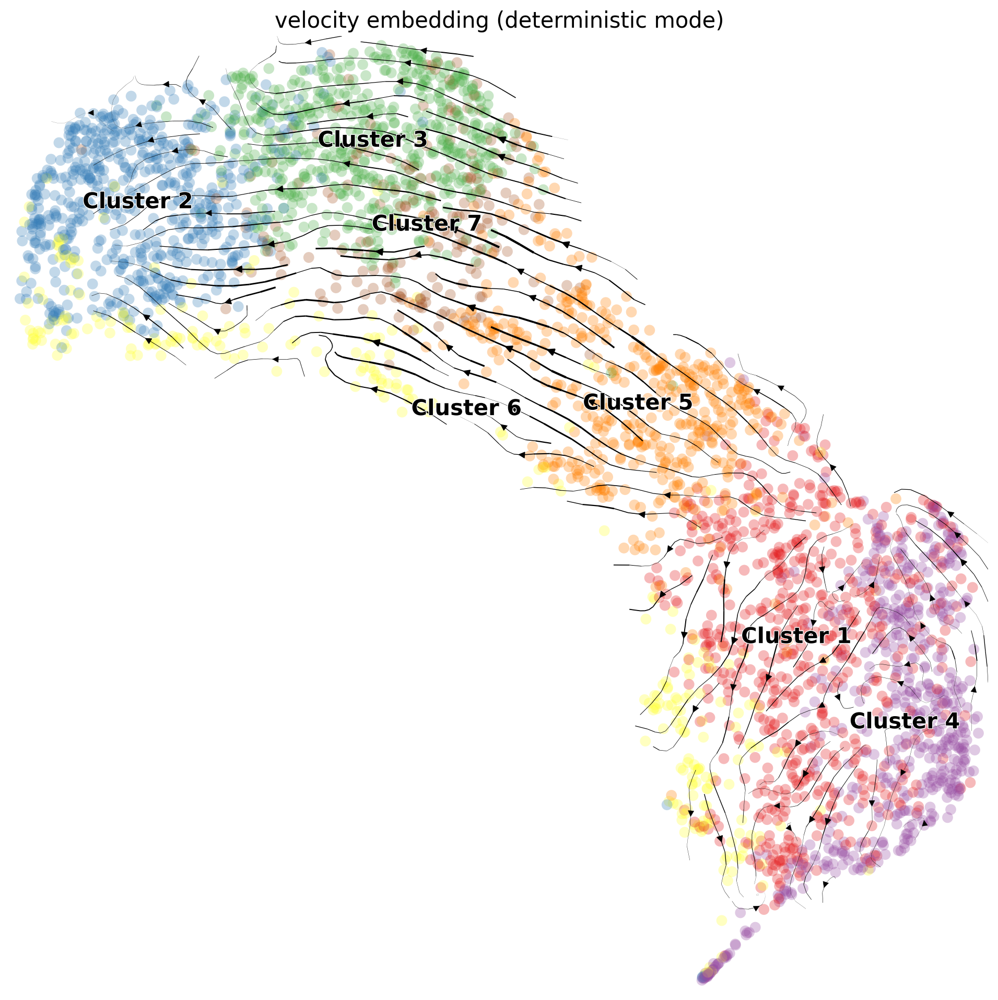

In [72]:
scv.pl.velocity_embedding_stream(Neutro3p_dt,basis="umap",color="Loupe",title='velocity embedding (deterministic mode)',fontsize=15,legend_fontsize=15,min_mass=2,palette=Colorss)

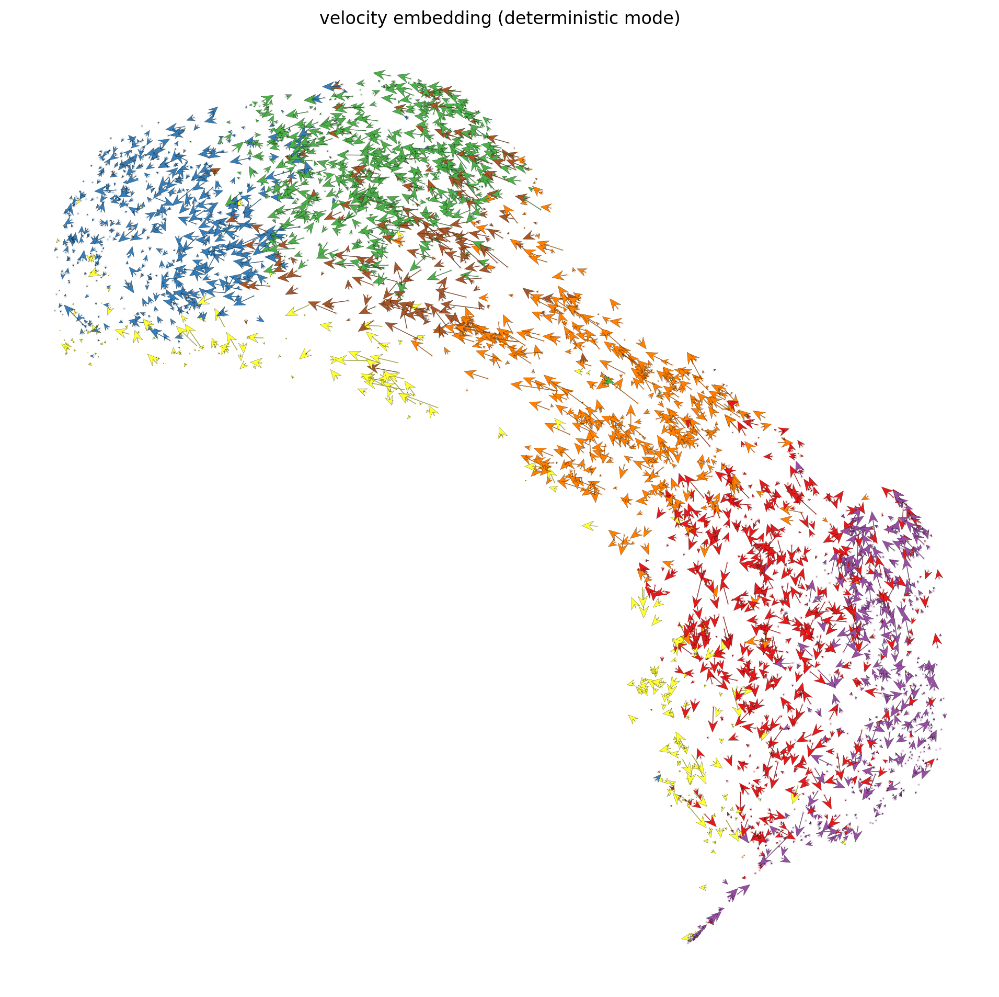

In [73]:
scv.pl.velocity_embedding(Neutro3p_dt,basis="umap",color="Loupe",title='velocity embedding (deterministic mode)',arrow_length=3, arrow_size=2)

- velocity length & confidenceの表示

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


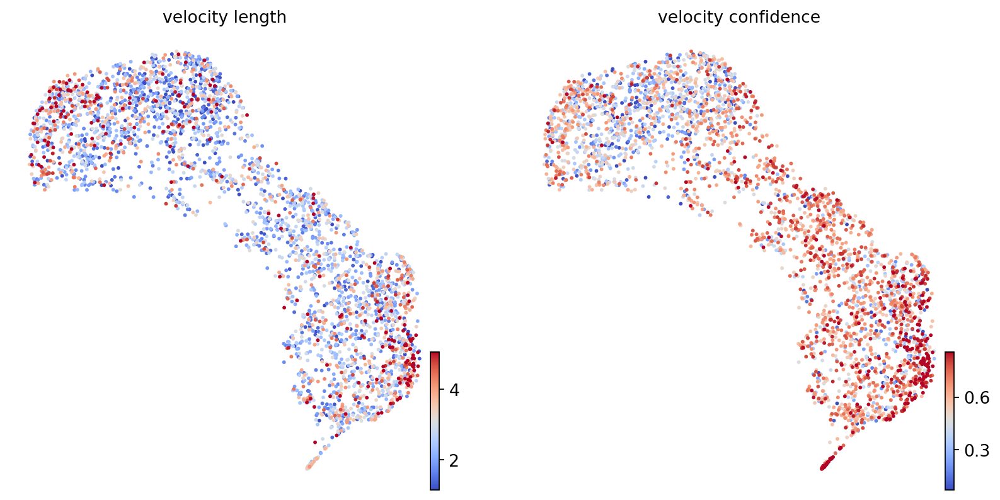

In [74]:
scv.tl.velocity_confidence(Neutro3p_dt)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(Neutro3p_dt, c=keys, cmap='coolwarm', perc=[5, 95])

In [75]:
df = Neutro3p_dt.obs.groupby('Loupe')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

Loupe,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5,Cluster 6,Cluster 7
velocity_length,2.727088,2.872736,2.436193,3.117989,2.608840,2.713759,2.392667
velocity_confidence,0.581550,0.421109,0.383295,0.631739,0.612987,0.544652,0.511561


- **決定論的モデルのVelocity推定結果について**
  - クラスター4, 1, 5にかけてvelocityベクトルの向きが乱れていて、分化の向きとあっていない
  - velocity lengthを見ても、一貫した分化系譜の傾向はみられない

<br />
<hr>

#### 確率論的モデルでのVelocity推定 + 低次元埋め込み

In [76]:
scv.tl.velocity(Neutro3p, mode='stochastic')

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [77]:
scv.tl.velocity_graph(Neutro3p)

computing velocity graph (using 1/20 cores)


  0%|          | 0/3343 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


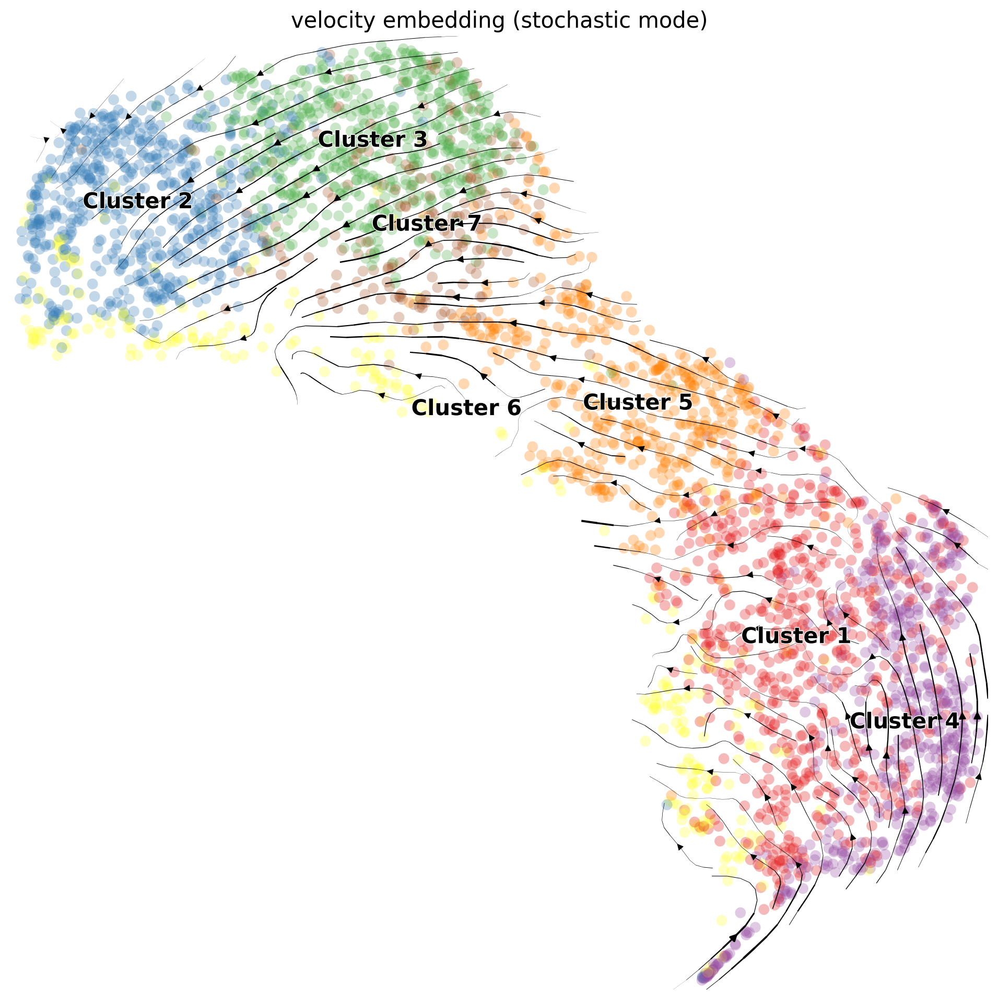

In [78]:
scv.pl.velocity_embedding_stream(Neutro3p,basis="umap",color="Loupe",title='velocity embedding (stochastic mode)',fontsize=15,legend_fontsize=15,min_mass=2,palette=Colorss)

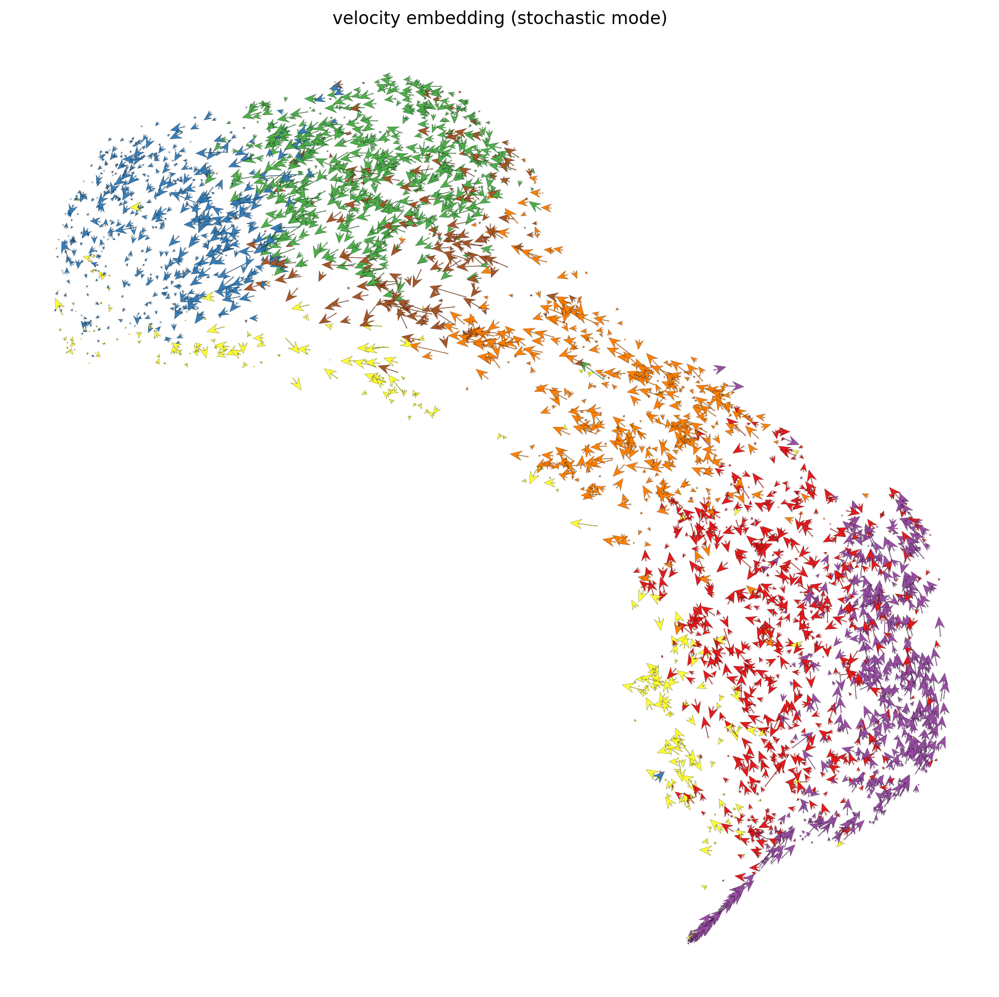

In [79]:
scv.pl.velocity_embedding(Neutro3p,basis="umap",color="Loupe",title='velocity embedding (stochastic mode)',arrow_length=3, arrow_size=2)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


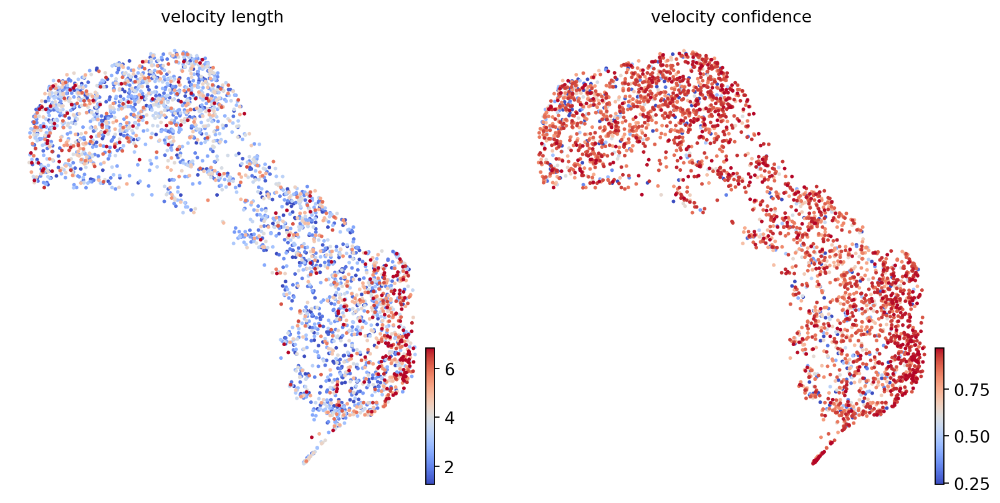

In [80]:
scv.tl.velocity_confidence(Neutro3p)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(Neutro3p, c=keys, cmap='coolwarm', perc=[5, 95])

- velocity pseudotimeプロット

computing terminal states
    identified 5 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


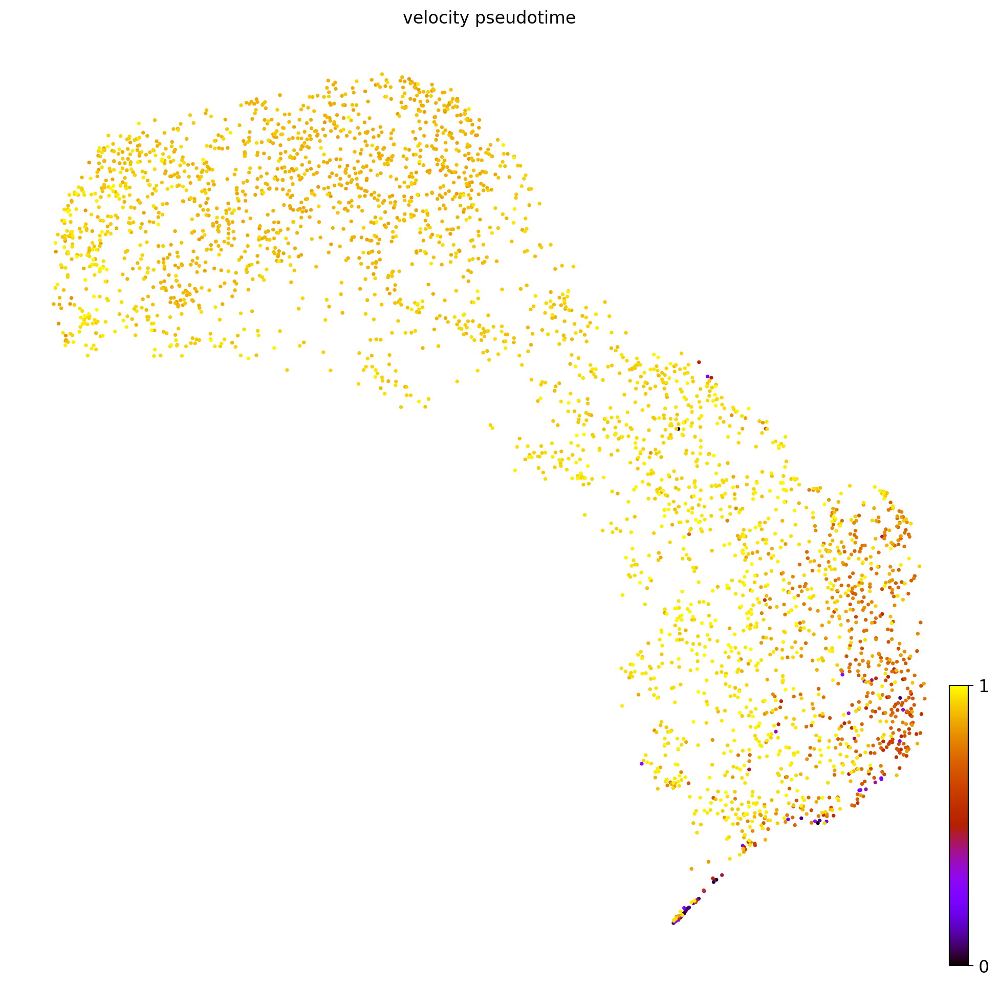

In [81]:
scv.tl.velocity_pseudotime(Neutro3p)
scv.pl.scatter(Neutro3p, color='velocity_pseudotime', cmap='gnuplot')

- **確率論的モデルのVelocity推定結果について**
  - 決定論的モデルよりは良くなったが、クラスター1のvelocityベクトルの向きが乱れていて、分化の向きとあっていないように見える
  - velocity lengthも、あまり一貫した分化系譜の傾向を表していない
  - pseudotimeでは、クラスター4以外はあまり変わらないように見える

<br />
<hr>

#### 動的モデルでのVelocity推定 + 低次元埋め込み

- 動的モデル用の前処理

In [82]:
scv.pp.filter_and_normalize(Neutro3p_D, min_shared_counts=30, n_top_genes=2000)
scv.pp.moments(Neutro3p_D, n_pcs=30, n_neighbors=30)

Filtered out 160 genes that are detected 30 counts (shared).
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


- EMアルゴリズムによるパラメータ推定
- velocity推定
- 遷移確率行列の生成
- 共有潜在時間を計算
  - 動的モデルから得られた遺伝子固有の潜在時間を、細胞の内部時計を表す普遍的な遺伝子共有潜在時間に変換し、その転写ダイナミクスのみに基づく潜在時間を算出する。

In [83]:
# Estimate RNA velocity and latent time
scv.tl.recover_dynamics(Neutro3p_D)
scv.tl.velocity(Neutro3p_D, mode='dynamical')
scv.tl.velocity_graph(Neutro3p_D)
scv.tl.recover_latent_time(Neutro3p_D)

recovering dynamics (using 1/20 cores)


  0%|          | 0/43 [00:00<?, ?gene/s]

    finished (0:00:17) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


  0%|          | 0/3343 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 3 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


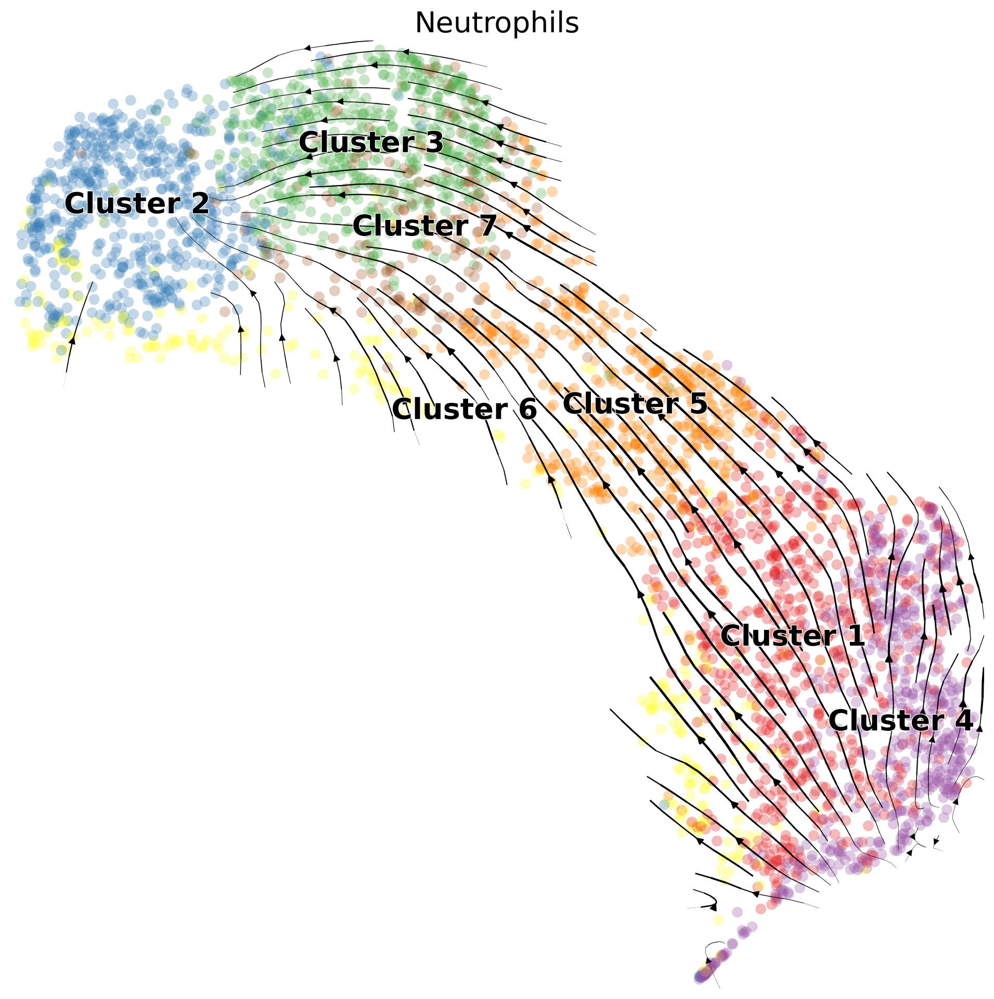

In [84]:
scv.pl.velocity_embedding_stream(Neutro3p_D,basis="umap",color="Loupe",title='Neutrophils',fontsize=20,legend_fontsize=20,min_mass=2,palette=Colorss)

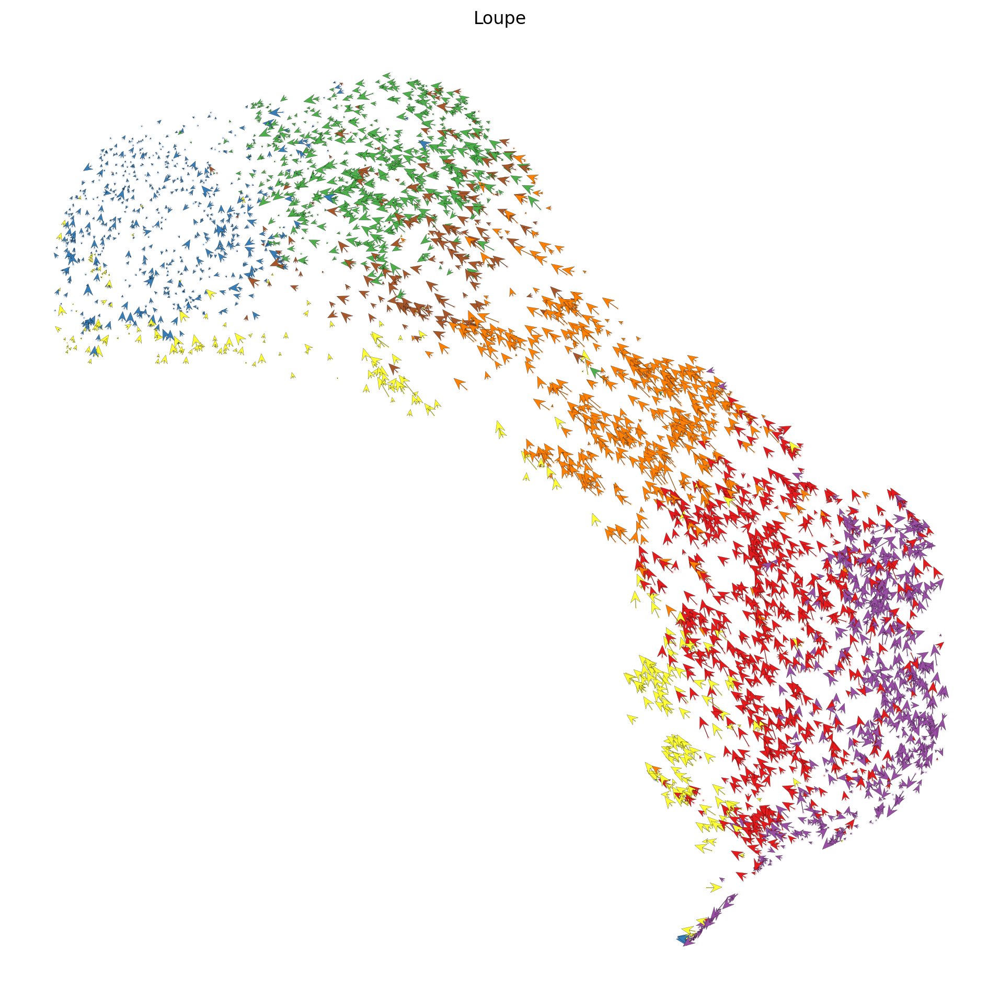

In [85]:
scv.pl.velocity_embedding(Neutro3p_D, arrow_length=3, arrow_size=2,color="Loupe")

- 共有潜在時間の反映 

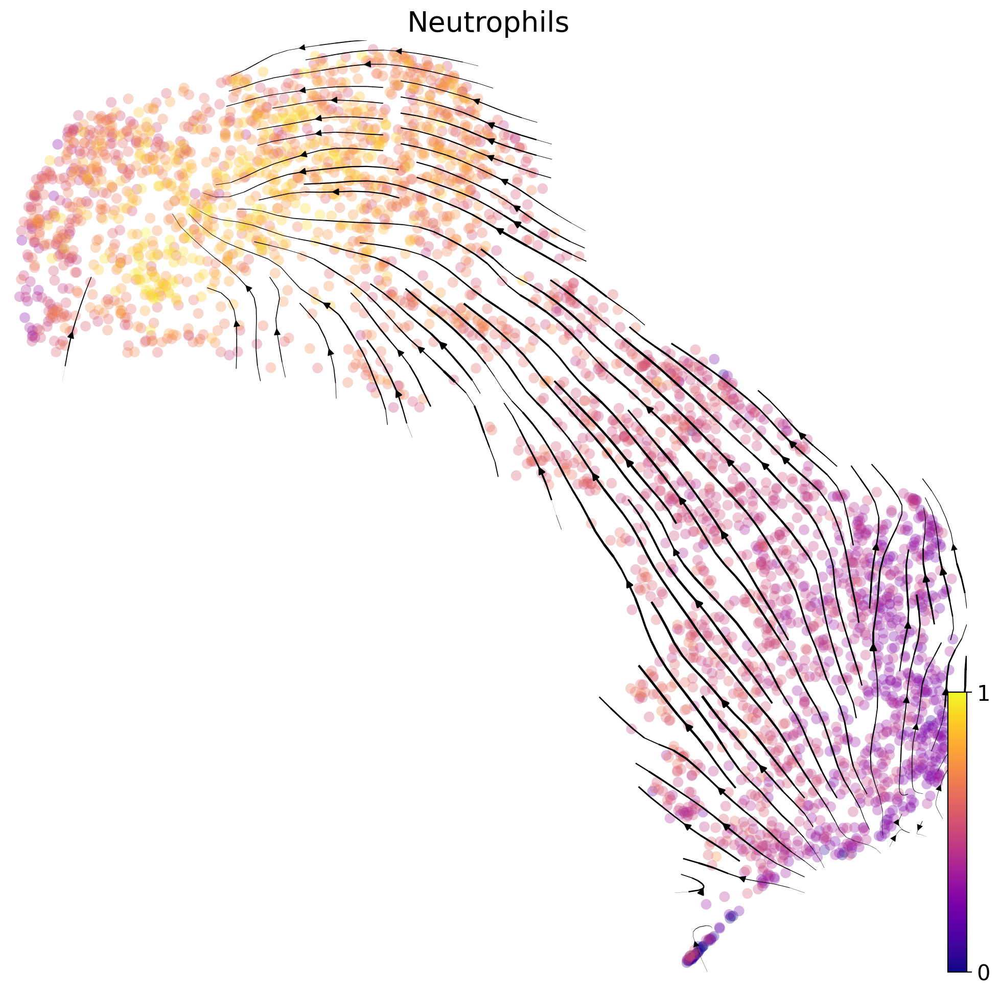

In [86]:
scv.pl.velocity_embedding_stream(Neutro3p_D,basis="umap",color="latent_time",title='Neutrophils',fontsize=20,legend_fontsize=20,min_mass=2,color_map="plasma")

- クラスターごとの共有潜在時間

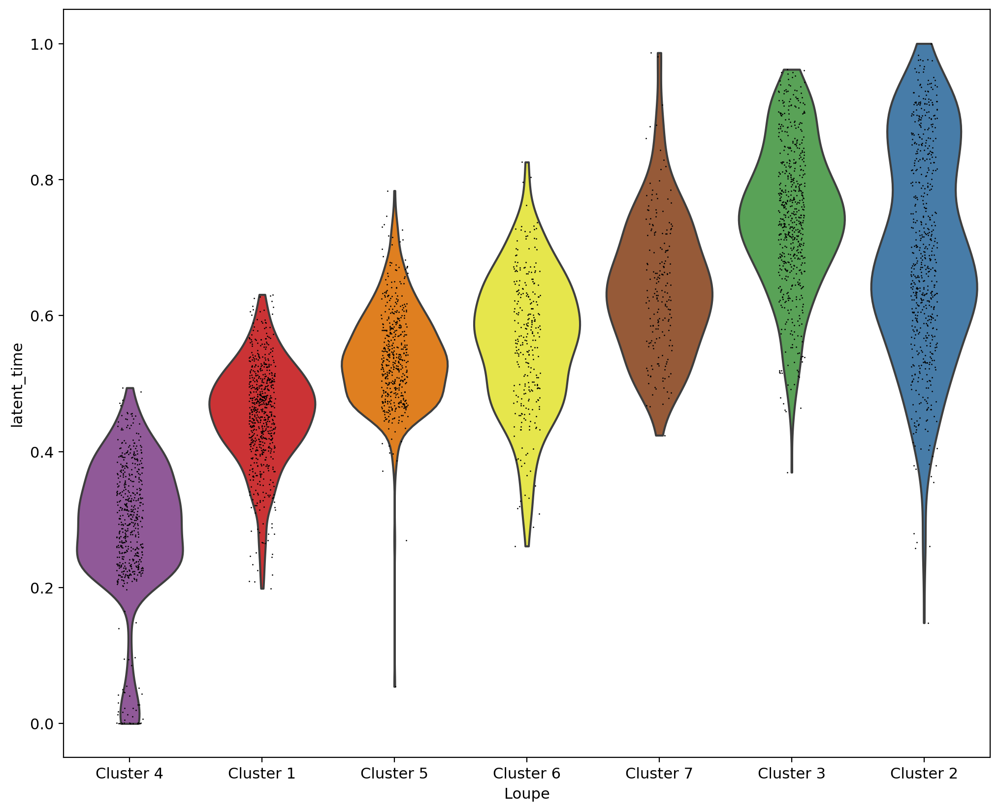

In [87]:
sc.pl.violin(Neutro3p_D, keys='latent_time',groupby="Loupe",order=["Cluster 4","Cluster 1","Cluster 5","Cluster 6","Cluster 7","Cluster 3","Cluster 2"])

- 発現変動遺伝子リストについて、共有潜伏期間でソートした各細胞でヒートマップを作成

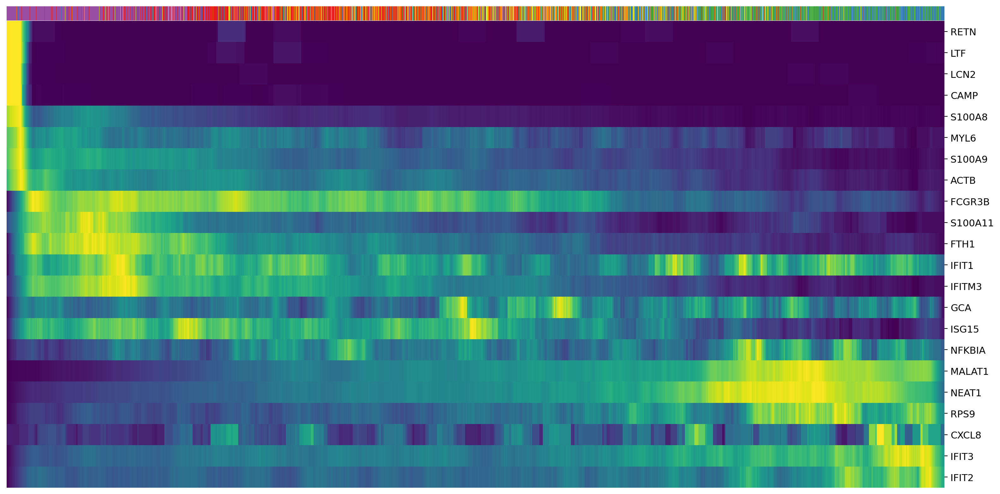

In [88]:
Genes=["RETN","LTF","CAMP","ACTB","GCA","LCN2", "S100A8","MYL6","S100A9","FCGR3B","S100A11","FTH1","IFIT1", "IFITM3","IFIT3","ISG15","IFIT2","RPS9","NEAT1","MALAT1","NFKBIA","CXCL8"]

scv.pl.heatmap(Neutro3p_D, var_names=Genes, sortby='latent_time', col_color='Loupe', n_convolve=100,figsize=(16,8),yticklabels=True,sort=True,colorbar=True,show=True,layer="count")

- 尤度の高い遺伝子ランク上位100個で、共有潜在時間ソートのヒートマップ

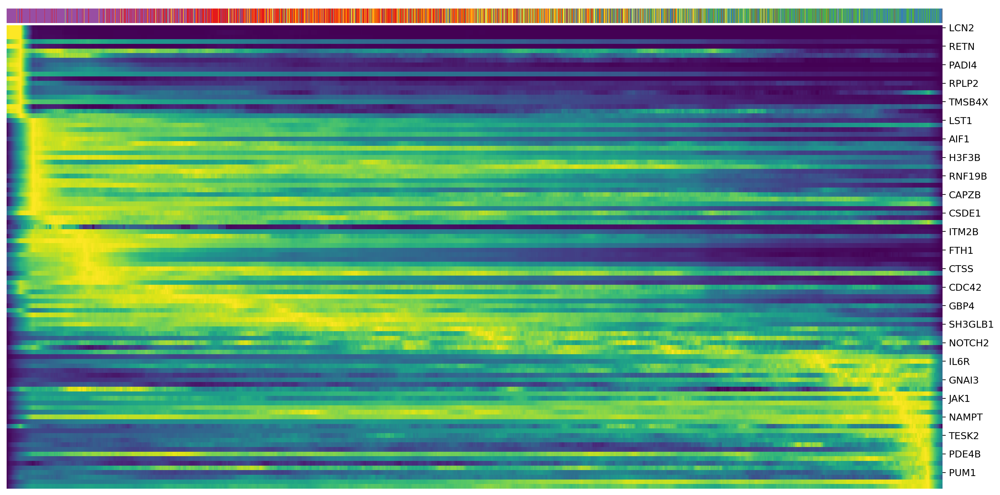

In [89]:
top_genes = Neutro3p_D.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.pl.heatmap(Neutro3p_D, var_names=top_genes, sortby='latent_time', col_color='Loupe', n_convolve=100, figsize=(16,8))

- 全体での上位5遺伝子

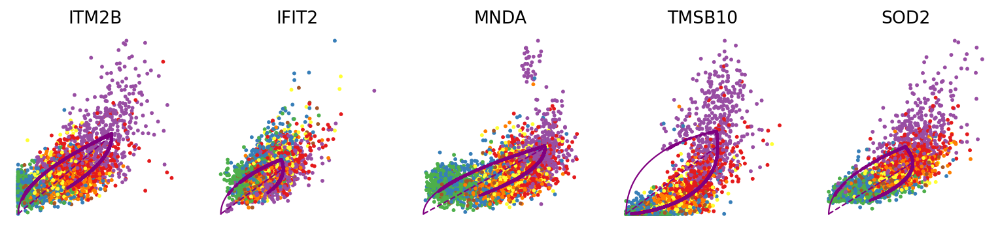

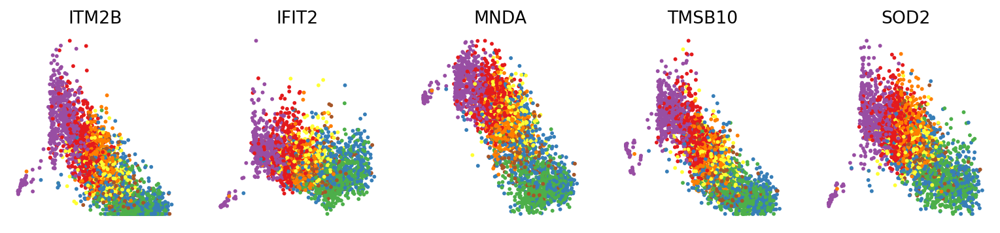

In [90]:
top_genes = Neutro3p_D.var['fit_likelihood'].sort_values(ascending=False).index

var_names = top_genes[:5]
scv.pl.scatter(Neutro3p_D, var_names, color='Loupe', frameon=False)
scv.pl.scatter(Neutro3p_D, x='latent_time', y=var_names, color='Loupe', frameon=False)

- クラスターごとの上位5遺伝子

In [98]:
scv.tl.rank_dynamical_genes(Neutro3p_D, groupby='Loupe')
df = scv.get_df(Neutro3p_D, 'rank_dynamical_genes/names')
df.head(5)

ranking genes by cluster-specific likelihoods
    finished (0:00:00) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5,Cluster 6,Cluster 7
0,MNDA,MNDA,IFIT2,RSAD2,ITM2B,ITM2B,MNDA
1,ITM2B,RSAD2,RSAD2,ACSL1,SOD2,MNDA,SOD2
2,SOD2,IFIT2,NAMPT,NAMPT,MNDA,SOD2,IFIT2
3,TMSB10,NAMPT,ACSL1,TMSB10,IFIT2,ACSL1,ACSL1
4,HLA-A,ACSL1,CXCL8,IFITM3,RSAD2,RSAD2,NAMPT


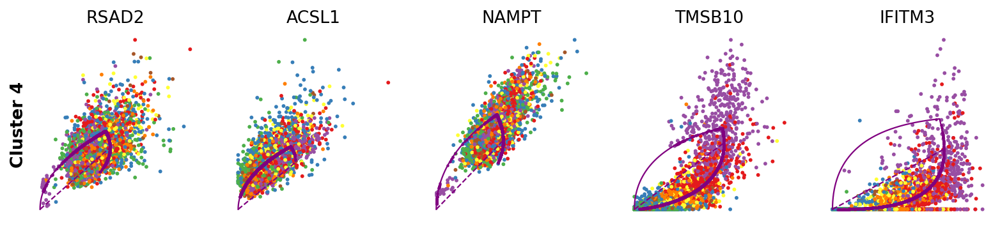

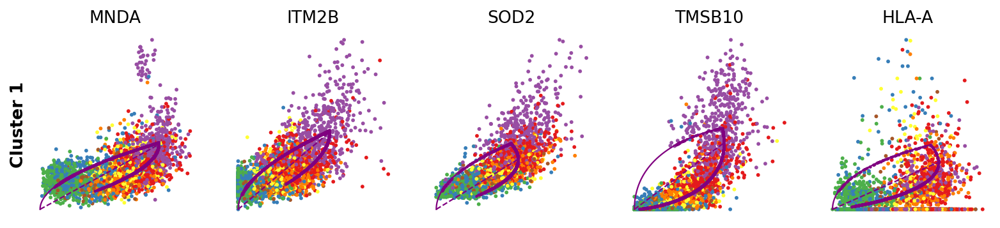

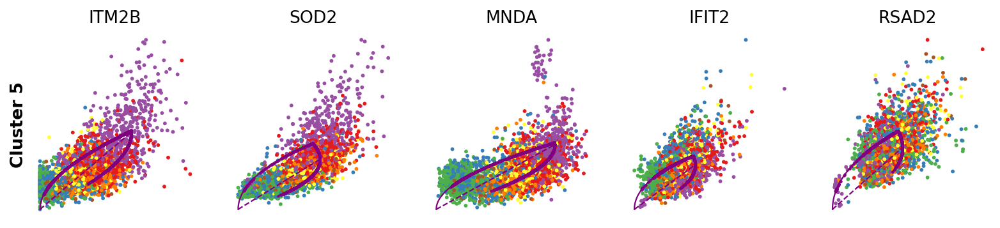

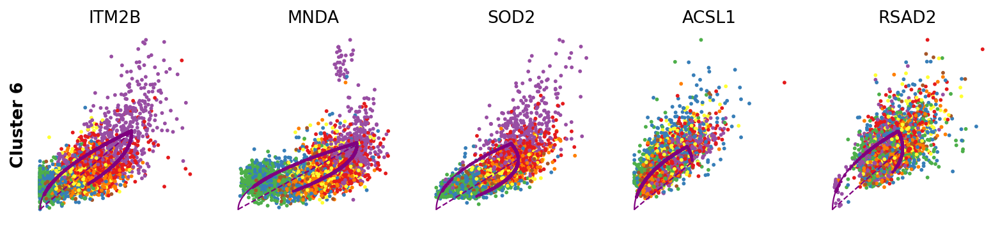

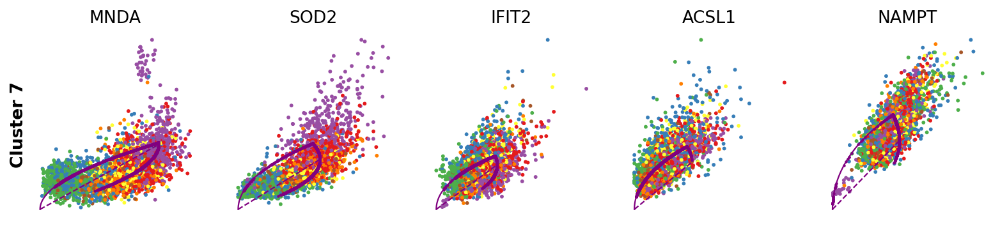

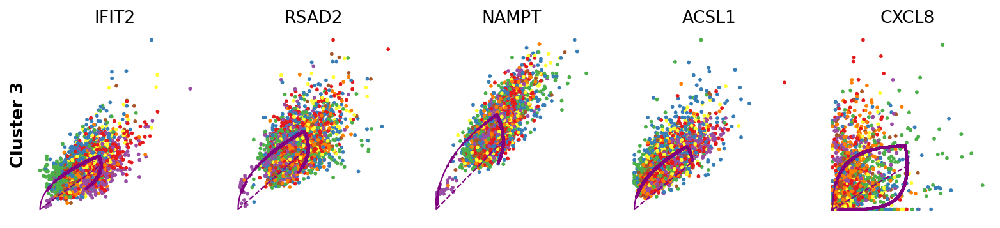

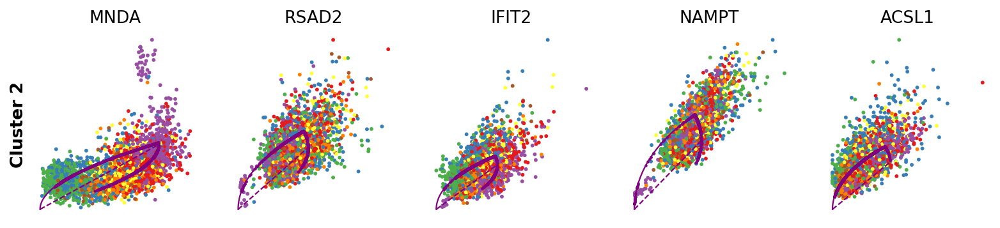

In [99]:
for cluster in ["Cluster 4","Cluster 1","Cluster 5","Cluster 6","Cluster 7","Cluster 3","Cluster 2"]:
    scv.pl.scatter(Neutro3p_D, df[cluster][:5], ylabel=cluster, color='Loupe', frameon=False)

<br />
<hr>

## 10xデータのVelocity解析のまとめ

- 決定論的モデルと確率論的モデル、動的モデルでVelocity推定を行った
- 低次元Velocity埋め込み結果では、動的モデルが最も正解データ(チュートリアル)と近かった
- 動的モデル特有の共有潜在時間、ドライバー遺伝子を抽出した

<br />
<hr>

## 全体のまとめ

### Velocity解析を実施する時のポイント

#### 1.velocyto,scVeloの実行環境の整備に時間がかかる(場合がある)
- 今回発生した環境準備での問題
  - velocyto
    - 依存するnambaで権限エラーが発生したため、回避できるdockerコンテナを自作する必要があった
    - 10xデモデータの出力フォーマットが古く、run10xコマンドが使用できなかった
  - scVelo
    - 最新版で10xのデータ解析中にエラー発生したため、ダウングレードした
    - scVeloが実行できるjupyter notebookのdockerコンテナが見つからず、自作する必要があった
- 何を踏むかは解析環境や解析データに依存するので、やってみないとわからない

#### 2.クラスタリング、UMAP次元圧縮を事前に実行しておく
- scVelo上でも可能だが、Seuratなど自分が使い慣れたツールで実施した方が良い
  - highly variable genesの選択
    - scVeloだけでは何も情報がない状態で決めないといけない
    - 例：Seuratでは選択したhighly variable genesの平均・分散の分布が確認できる
  - クラスタリングでのクラスタ数調整
    - scVelo上よりもSeuratで行った方がやりやすい(個人の感想)
  - velocity埋め込み
    - 遷移確率行列は低次元空間上の座標を元に計算するため、良いプロット(=事前知識と一致する)を使用する方が良い
  - 露崎さん補足 : Seuratを一回PythonのAnnDataに変換するステップが必要
    - https://github.com/kokitsuyuzaki/urchin-workflow3/blob/7fd9b1c73fbfa0c1d673f27ed55ba549d12a9920/workflow/velocity.smk#L76


#### 3.系譜解析手法などで他の知見も得ておく
- 選択するモデルによって推定されるVelocity結果が異なる
  - scVeloでは、決定論的モデルの使用は推奨されていないが、確率論的モデルと動的モデルのどちらが良いかはデータによる
    - 動的モデルよりも確率論的モデルの方が実際の系譜と一致することもある
    - 結果の良い悪いの判定基準はどうしても事前知識に頼ることになる
    - 事前知識が不十分な場合は、分化の過程を可視化する系譜解析手法を合わせて実施すると良い
      - ルート細胞がどのクラスタにいるかなど、有用な情報が得られる可能性
- （それに関連し）pseudotimeと細胞latent time=共有潜在時間の違いに注意する
  - 確率論的モデルで算出されるpseudotimeは、velocityグラフを基にしたルート細胞(推定)からの距離測定
  - 動的モデルで算出される共有潜在時間は、遺伝子ごとに推定された潜在時間から多数決で決められたもの